<a href="https://colab.research.google.com/github/edwin-yan/Passion-Fruit-Disease-Detection/blob/andrew/EDA_colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SET UP
## Mounting

Note that this assumes that your google drive folder has the same document layout. You must modify if that is not the case.


From your root Google Drive directory create a couple of folders:
* `JHU/DNN/FinalProject/Train_Images`
* `JHU/DNN/FinalProject/Test_Images` 

with Train and test images unzipped in those directories



# **TODO:** GLOBAL VARIABLE set to `True` if using colab and `False` if not!

In [ ]:
IS_COLAB = True 

# **TODO:** CHANGE `IMG_DIR` if your google drive directory is different

In [ ]:
if IS_COLAB:
  from google.colab import drive
  drive.mount('/content/drive')
  IMG_PATH = '/content/drive/MyDrive/JHU/DNN/FinalProject'
else:
  IMG_PATH= '.'

Mounted at /content/drive


In [ ]:
TRAIN_PATH = f'{IMG_PATH}/Train.csv'
TEST_PATH = f'{IMG_PATH}/Test.csv'

In [ ]:
import time

t0 = time.time()

## Imports

In [ ]:
# Clone from repo and cd into repo
!git clone https://github.com/edwin-yan/Passion-Fruit-Disease-Detection

# Change directory
%cd Passion-Fruit-Disease-Detection

# Checkout specific branch
!git checkout andrew

Cloning into 'Passion-Fruit-Disease-Detection'...
remote: Enumerating objects: 113, done.
remote: Counting objects: 100% (113/113), done.
remote: Compressing objects: 100% (97/97), done.
remote: Total 113 (delta 53), reused 37 (delta 10), pack-reused 0
Receiving objects: 100% (113/113), 73.59 MiB | 12.79 MiB/s, done.
Resolving deltas: 100% (53/53), done.
/content/Passion-Fruit-Disease-Detection
Branch 'andrew' set up to track remote branch 'andrew' from 'origin'.
Switched to a new branch 'andrew'


In [ ]:
!ls

Baseline_Model.ipynb					      README.md
Eager_few_shot_od_training_colab_DNN_FINAL.ipynb	      Test.csv
EDA.ipynb						      Test_Images
helper.py						      Train.csv
Interactive_eager_few_shot_od_training_colab_DNN_FINAL.ipynb  Train_Images
Models


In [ ]:
import pandas as pd
from helper import plot_sample_images, plot_sample_images_multi

In [ ]:
df_train, df_test = pd.read_csv(TRAIN_PATH), pd.read_csv(TEST_PATH)
print(f"Training Data Shape:  {df_train.shape}\nTest Data Shape:      {df_test.shape}")

Training Data Shape:  (3906, 6)
Test Data Shape:      (931, 1)


In [ ]:
df_train.Image_ID.value_counts().head(10)

ID_LZI2KVVE    5
ID_AF7K88JS    5
ID_M34YFAR2    5
ID_XEMG90OT    5
ID_OYN556Y0    5
ID_D82I40M4    4
ID_13DOIJXI    4
ID_HAC2KQXS    4
ID_5LSWR9I5    4
ID_2OZEHLDV    4
Name: Image_ID, dtype: int64

In [ ]:
df_train['class'].value_counts()

fruit_healthy      1638
fruit_woodiness    1246
fruit_brownspot    1022
Name: class, dtype: int64

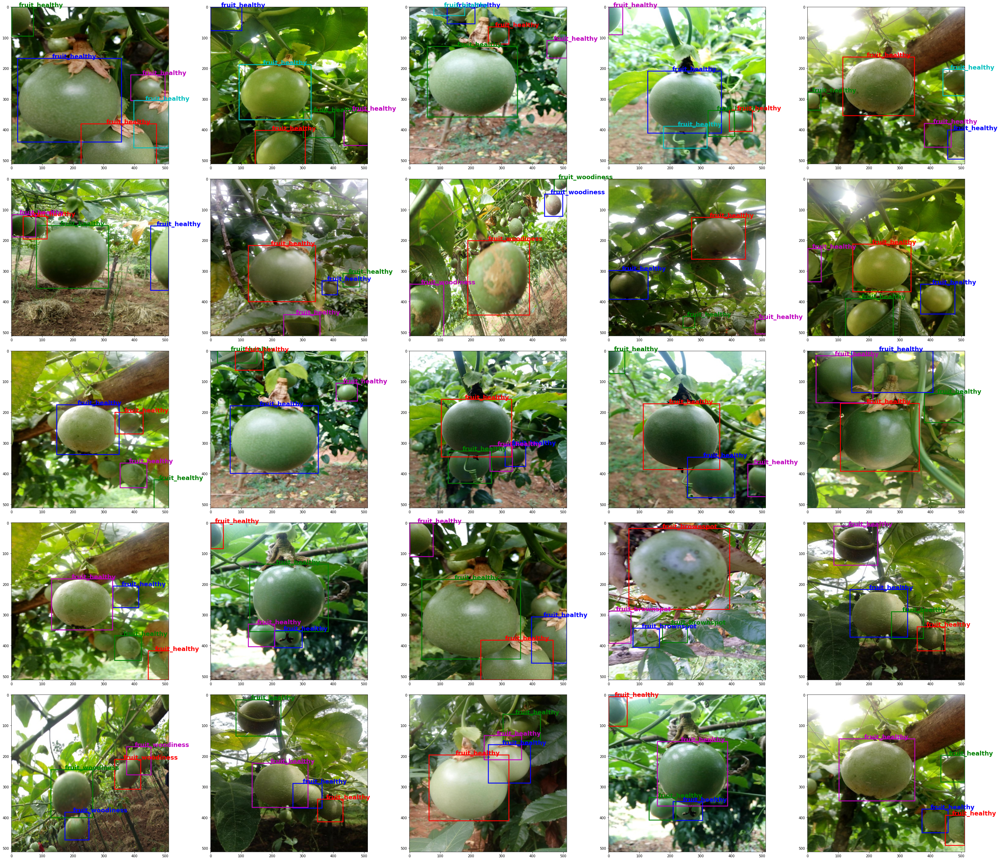

In [ ]:
plot_sample_images_multi(df_train,dir_path=IMG_PATH)

In [ ]:
plot_sample_images_multi(df_test, show_label=False, is_train=False,dir_path=IMG_PATH)

# Convert to YOLO 5 annotation format

https://roboflow.com/formats/yolov5-pytorch-txt

Each image has one txt file with a single line for each bounding box. The format of each row is

`class_id center_x center_y width height`

In [ ]:
df_train.head()

,Image_ID,class,xmin,ymin,width,height
0,ID_007FAIEI,fruit_woodiness,87.0,87.5,228.0,311.0
1,ID_00G8K1V3,fruit_brownspot,97.5,17.5,245.0,354.5
2,ID_00WROUT9,fruit_brownspot,156.5,209.5,248.0,302.5
3,ID_00ZJEEK3,fruit_healthy,125.0,193.0,254.5,217.0
4,ID_018UIENR,fruit_brownspot,79.5,232.5,233.5,182.0


In [ ]:
# get center_x
df_train['center_x'] = df_train['xmin'] + df_train['width']/2

In [ ]:
# get center_y
df_train['center_y'] = df_train['ymin'] + df_train['height']/2

In [ ]:
df_train.head()

,Image_ID,class,xmin,ymin,width,height,center_x,center_y
0,ID_007FAIEI,fruit_woodiness,87.0,87.5,228.0,311.0,201.00,243.00
1,ID_00G8K1V3,fruit_brownspot,97.5,17.5,245.0,354.5,220.00,194.75
2,ID_00WROUT9,fruit_brownspot,156.5,209.5,248.0,302.5,280.50,360.75
3,ID_00ZJEEK3,fruit_healthy,125.0,193.0,254.5,217.0,252.25,301.50
4,ID_018UIENR,fruit_brownspot,79.5,232.5,233.5,182.0,196.25,323.50


In [27]:
# Use .apply to map class to integer:
# https://stackoverflow.com/questions/50002738/replacing-a-string-by-an-integer-dictionary-in-python-pandas-dataframe
class_dic = {
    'fruit_healthy':1,
    'fruit_woodiness':2,
    'fruit_brownspot':3
}
df_train['class_ints'] = df_train['class']
df_train['class_ints']=df_train['class_ints'].apply(lambda x: class_dic.get(x))


In [28]:
df_train.head()

,Image_ID,class,xmin,ymin,width,height,center_x,center_y,class_ints
0,ID_007FAIEI,fruit_woodiness,87.0,87.5,228.0,311.0,201.00,243.00,2
1,ID_00G8K1V3,fruit_brownspot,97.5,17.5,245.0,354.5,220.00,194.75,3
2,ID_00WROUT9,fruit_brownspot,156.5,209.5,248.0,302.5,280.50,360.75,3
3,ID_00ZJEEK3,fruit_healthy,125.0,193.0,254.5,217.0,252.25,301.50,1
4,ID_018UIENR,fruit_brownspot,79.5,232.5,233.5,182.0,196.25,323.50,3
